In [45]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [46]:
dataset = pd.read_csv('data/creditcard.csv')

In [47]:
sns.set()

In [48]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\habab\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data

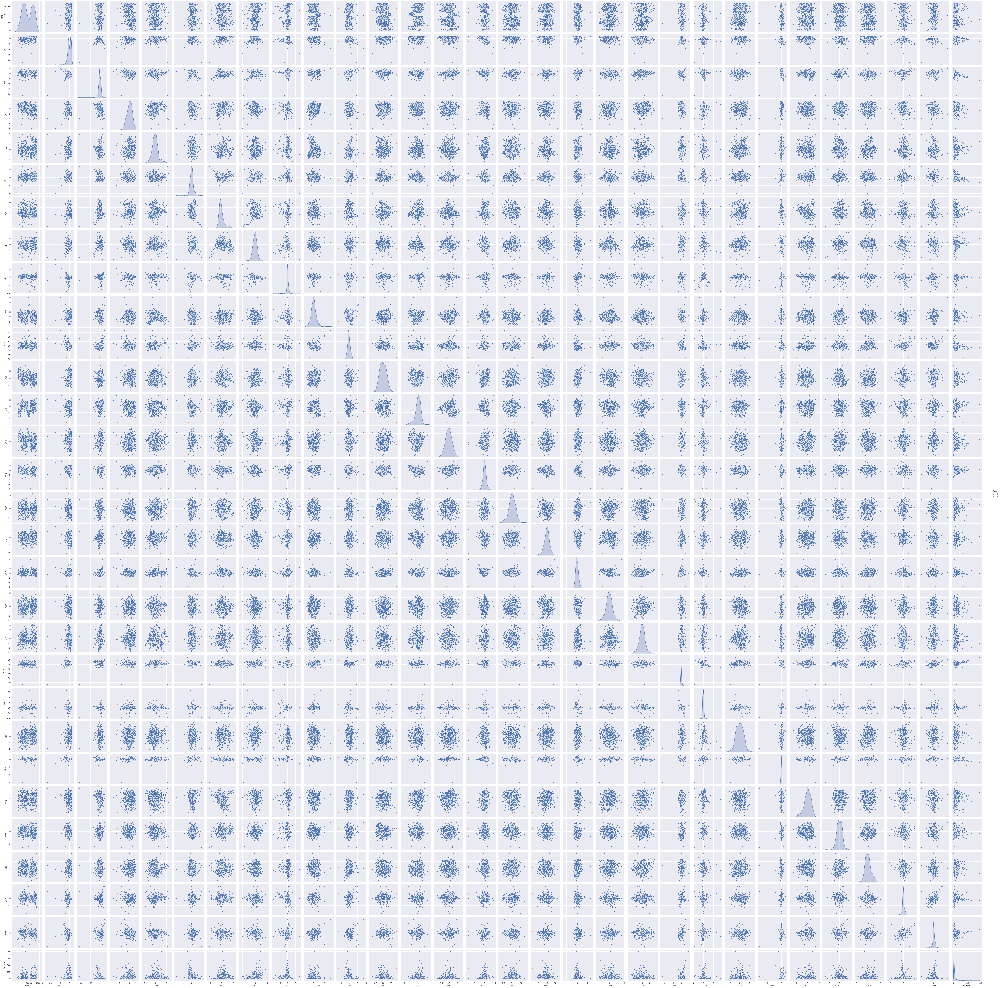

In [18]:
sns.pairplot(dataset.sample(1000), hue='Class')

In [49]:
data_x = dataset.drop('Class', 1)
data_y = dataset['Class']
x_mat = data_x.values
y_mat = data_y.values

In [50]:
from matplotlib.colors import ListedColormap

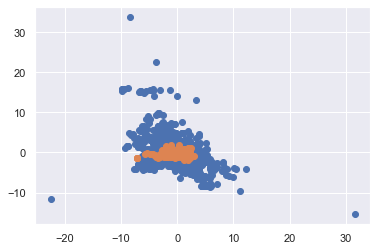

In [51]:
for i,j in enumerate(np.unique(y_mat)):
    plt.scatter(x_mat[y_mat == i, 27], x_mat[y_mat == j, 28],
                cmap = ListedColormap(('green', 'yellow'))(i), label=j)

In [52]:
#KNN, RandomForest & Decision Will Be Good here.

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
train_x,test_x,train_y,test_y = train_test_split(data_x, data_y, test_size=0.3, random_state=42)

In [65]:
train_x.shape,train_y.shape

((199364, 30), (199364,))

In [66]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix

class classification_hook:
    
    def __init__(self, x, y, x_, y_, dict_=False):
        
        self.x_test = x
        self.y_test = y
        self.x_train = x_
        self.y_train = y_
        self.dict_ins = {}
        self.dict = dict_
    
    def confusion(self, mat, classifier_):
        
        sns.heatmap(mat, annot=True, fmt='d')
        plt.title(classifier_)
        plt.show()
    
    def ADA(self):
        
        model = AdaBoostClassifier(n_estimators=100, random_state=0).fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'AdaBoostClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'AdaBoostClassifier')
    
    def GRAD_2(self):
        
        model = GradientBoostingClassifier().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'GradientBoostingClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'GradientBoostingClassifier')
    
    def LOG(self):
        
        model = LogisticRegression(max_iter = 9999).fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'Logistic Score: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'Logistic Classifier')
        
    
    def GRAD(self):
        
        model = SGDClassifier().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'SGDClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'SGDClassifier')
        
            
    def VECTOR(self):
        
        model = SVC().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'SVC: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'Support Vector Classifier')
    
    def KN(self):
        
        model = KNeighborsClassifier().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'KNeighborsClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'KNeighborsClassifier')
    
    def ense(self):
        
        model = RandomForestClassifier().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'RandomForestClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'RandomForestClassifier')
    
    def tree(self):
        
        model = DecisionTreeClassifier().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'DecisionTreeClassifier: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'DecisionTreeClassifier')
    
    def bayes(self):
        
        model = GaussianNB().fit(self.x_train, self.y_train)
        score = model.score(self.x_test, self.y_test)
        print(f'GaussianNB: {score * 100} % Acc')
        mat = confusion_matrix(self.y_test, model.predict(self.x_test))
        self.confusion(mat, 'GaussianNB')
    

    
    def start(self):
        
        print("""Staring Classification Training & Testing""")
        print()
        self.LOG()
        self.GRAD()
        self.VECTOR()
        self.KN()
        self.ense()
        self.tree()
        self.bayes()
        self.ADA()
        self.GRAD_2()

Staring Classification Training & Testing

Logistic Score: 99.86189623491684 % Acc


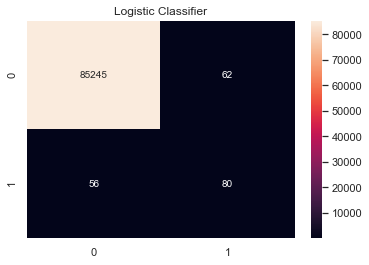

SGDClassifier: 99.833807333544 % Acc


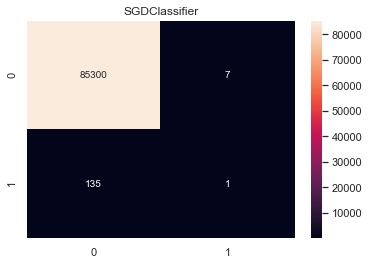

SVC: 99.84082955888721 % Acc


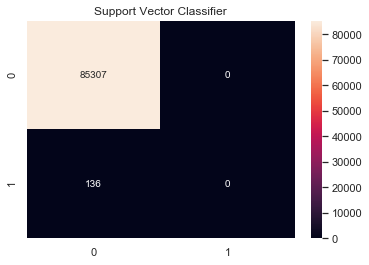

KNeighborsClassifier: 99.84785178423043 % Acc


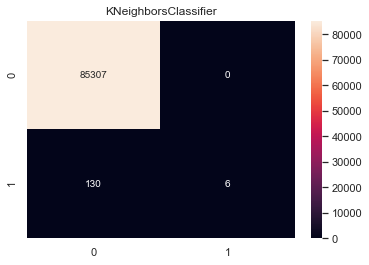

RandomForestClassifier: 99.9602073897218 % Acc


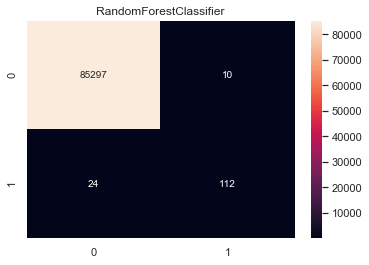

DecisionTreeClassifier: 99.91456292499093 % Acc


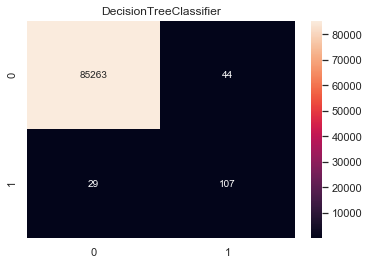

GaussianNB: 99.30479969102208 % Acc


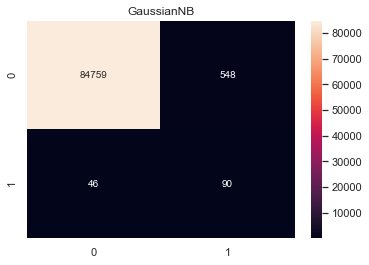

AdaBoostClassifier: 99.94850368081644 % Acc


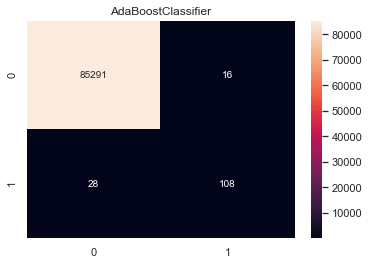

GradientBoostingClassifier: 99.85838512224524 % Acc


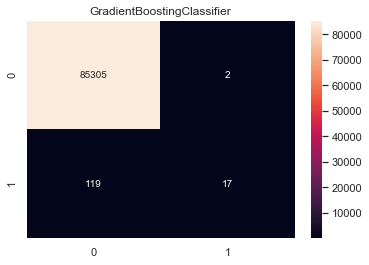

In [67]:
%matplotlib inline
classification_hook(test_x,test_y,train_x,train_y).start()

In [ ]:
"""
Since we are working on fraud detected we need more recall and less accuracy, Select the model
with less false negative predictions. Random Forest Seems to be doing Good !
"""